<a href="https://colab.research.google.com/github/ValentinGuigon/Neuromatch_NeuroAI_tutorials/blob/main/tutorials/W1D3_ComparingArtificialAndBiologicalNetworks/student/W1D3_Tutorial3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/neuromatch/NeuroAI_Course/blob/main/tutorials/W1D3_ComparingArtificialAndBiologicalNetworks/student/W1D3_Tutorial3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a> &nbsp; <a href="https://kaggle.com/kernels/welcome?src=https://raw.githubusercontent.com/neuromatch/NeuroAI_Course/main/tutorials/W1D3_ComparingArtificialAndBiologicalNetworks/student/W1D3_Tutorial3.ipynb" target="_parent"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" alt="Open in Kaggle"/></a>

# Tutorial 3: Statistical inference on representational geometries

**Week 1, Day 3: Comparing Artificial And Biological Networks**

**By Neuromatch Academy**

__Content creators:__ Veronica Bossio, Eivinas Butkus, Jasper van den Bosch

__Content reviewers:__ Samuele Bolotta, Yizhou Chen, RyeongKyung Yoon, Ruiyi Zhang, Lily Chamakura, Patrick Mineault, Hlib Solodzhuk, Alex Murphy

__Production editors:__ Konstantine Tsafatinos, Ella Batty, Spiros Chavlis, Samuele Bolotta, Hlib Solodzhuk, Patrick Mineault, Alex Murphy


___


# Tutorial Objectives

*Estimated timing of tutorial: 50 minutes*

To evaluate alternative models of measured data, we need statistical inference that takes our uncertainty about relative model performance into account.
In computational neuroscience, we want to statistically compare different models in terms of their ability to account for representations in brains.
In AI, we can employ similar techniques to compare models to each other and understand their internal representations.

By the end of this tutorial, you will be able to:

1. Understand Representational Similarity Analysis (RSA), including its theoretical foundations, practical applications, and its significance in the context of machine learning and computational neuroscience.

2. Extract neural network activations; understand the structure of neural networks, the role of activations in interpreting neural network decisions, and practical techniques for accessing these activations.

3. Discuss frequentist model comparison: This part of the tutorial will cover the basics of frequentist model comparison methods. It will provide an overview of the principles underlying these methods and their applications.

4. Identify sources of estimation error and the motivation for model-comparative frequentist inference. You will learn about the three main sources of estimation error in statistical inference—measurement noise, stimulus sampling, and subject sampling. Additionally, the tutorial will explore how these sources of error justify the use of model-comparative frequentist inference, particularly through the application of the 2-factor bootstrap method. This section will detail the impact of each source of error on statistical inference and demonstrate how the 2-factor bootstrap accounts for our uncertainty about model performance during model comparison.

In [11]:
# @title Tutorial slides
# @markdown These are the slides for the videos in all tutorials today

from IPython.display import IFrame
from ipywidgets import widgets
out = widgets.Output()

link_id = "uwn2g"

with out:
    print(f"If you want to download the slides: https://osf.io/download/{link_id}/")
    display(IFrame(src=f"https://mfr.ca-1.osf.io/render?url=https://osf.io/{link_id}/?direct%26mode=render%26action=download%26mode=render", width=730, height=410))
display(out)

Output()

---
# Setup



In [12]:
# @title Install and import feedback gadget

!pip install numpy pandas torch torchvision matplotlib ipython Pillow plotly networkx requests vibecheck --quiet
!pip install rsatoolbox==0.1.5 --quiet


from vibecheck import DatatopsContentReviewContainer
def content_review(notebook_section: str):
    return DatatopsContentReviewContainer(
        "",  # No text prompt
        notebook_section,
        {
            "url": "https://pmyvdlilci.execute-api.us-east-1.amazonaws.com/klab",
            "name": "neuromatch_neuroai",
            "user_key": "wb2cxze8",
        },
    ).render()


feedback_prefix = "W1D3_T3"

In [13]:
# @title Import dependencies

# Standard library imports
import pathlib
import logging


# Third-party library imports
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
from IPython.display import IFrame, display
from IPython.display import Image as IMG
from PIL import Image
import rsatoolbox as rsa

from copy import deepcopy

import ipywidgets as widgets
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from IPython.display import clear_output, display
from plotly import colors
from plotly.subplots import make_subplots
from rsatoolbox.inference import evaluate as eval
from rsatoolbox.inference.bootstrap import (bootstrap_sample,
                                            bootstrap_sample_pattern,
                                            bootstrap_sample_rdm)
from rsatoolbox.util.inference_util import all_tests, get_errorbars
from rsatoolbox.util.rdm_utils import batch_to_vectors

import os
import requests
import hashlib
import zipfile
from torchvision.models.feature_extraction import get_graph_node_names
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from torchvision.models.feature_extraction import create_feature_extractor

import warnings
from copy import deepcopy

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import plotly.colors
import plotly.graph_objects as go
from matplotlib import cm, patches, transforms
from matplotlib.path import Path
from networkx.algorithms.clique import find_cliques as maximal_cliques
from plotly.express import colors
from plotly.subplots import make_subplots
from rsatoolbox.util.inference_util import all_tests, get_errorbars
from rsatoolbox.util.rdm_utils import batch_to_vectors
from scipy.spatial.distance import squareform

# Enabling automatic reloading of modules before executing user code
#%reload_ext autoreload
#%autoreload 2

In [14]:
# @title Figure settings

logging.getLogger('matplotlib.font_manager').disabled = True

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # perfrom high definition rendering for images and plots
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/main/nma.mplstyle")

In [15]:
# @title Plotting functions

def traces_bar_and_scatter(eval_result, models, bar_color='blue'):

    evaluations = eval_result.evaluations.squeeze()
    subject_names = [f'Subject {i+1}' for i in range(evaluations.shape[1])]
    model_names = [model.name for model in models]
    df_evaluations = pd.DataFrame(data=evaluations, index=model_names, columns=subject_names)
    means = df_evaluations.mean(axis=1)
    sem = df_evaluations.sem(axis=1)

    bars_trace = go.Bar(
        x=model_names,
        y=means,
        showlegend=False,
        marker_color=bar_color
    )

    scatter_traces = []
    for subject in subject_names:
        if subject == "Subject 1":
            showlegend = True
        scatter_traces.append(go.Scatter(
            x=df_evaluations.index,
            y=df_evaluations[subject],
            mode='markers',
            marker=dict(size=5,
                        color='white',
                        line=dict(width=1)),
            showlegend=False
        ))
    blank_trace = go.Scatter(
        x=[None],  # This ensures the trace doesn't actually plot data
        y=[None],
        mode='markers',
        marker=dict(size=5, color='white', line=dict(width=1)),
        name='Each dot represents <br> a subject'
        )
    return bars_trace, scatter_traces, blank_trace

def plot_bars_and_scatter_from_trace(bars_trace, scatter_traces, blank_trace):

    fig = go.Figure()
    fig.add_trace(bars_trace)
    for trace in scatter_traces:
        fig.add_trace(trace)
    fig.add_trace(blank_trace)
    fig.update_layout(
        title="",
        xaxis_title="Model",
        yaxis_title="Cosine Similarity to Data RDMs",
        legend_title="",
        width=700,
        height=500,
        template="simple_white"
    )
    return fig

def convert_result_to_list_of_dicts(result):
    means = result.get_means()
    sems = result.get_sem()
    p_zero = result.test_zero()
    p_noise = result.test_noise()
    model_names = [model.name for model in result.models]

    results_list = []
    for i, model_name in enumerate(model_names):
        result_dict = {
            "Model": model_name,
            "Eval±SEM": f"{means[i]:.3f} ± {sems[i]:.3f}",
            "p (against 0)": "< 0.001" if p_zero[i] < 0.001 else f"{p_zero[i]:.3f}",
            "p (against NC)": "< 0.001" if p_noise[i] < 0.001 else f"{p_noise[i]:.3f}"
        }
        results_list.append(result_dict)

    return results_list

def print_results_table(table_trace):

    fig = go.Figure()
    fig.add_trace(table_trace)

    return fig

def get_trace_for_table(eval_result):

    results_list = convert_result_to_list_of_dicts(eval_result)

    table_trace = go.Table(
        header=dict(values=["Model", "Eval ± SEM", "p (against 0)", "p (against NC)"]),
        cells=dict(
            values=[
                [result["Model"] for result in results_list],  # Correctly accesses each model name
                [result["Eval±SEM"] for result in results_list],  # Correctly accesses the combined Eval and SEM value
                [result["p (against 0)"] for result in results_list],  # Accesses p-value against 0
                [result["p (against NC)"] for result in results_list]  # Accesses p-value against noise ceiling
            ],
            font=dict(size=12),  # Smaller font size for the cells
            height=27  # Smaller height for the cell rows
            )
    )
    return table_trace

def get_trace_for_noise_ceiling(noise_ceiling):

    noise_lower = np.nanmean(noise_ceiling[0])
    noise_upper = np.nanmean(noise_ceiling[1])
    #model_names = [model.name for model in models]

    noise_rectangle = dict(
            # Rectangle reference to the axes
            type="rect",
            xref="x domain",  # Use 'x domain' to span the whole x-axis
            yref="y",  # Use specific y-values for the height
            x0=0,  # Starting at the first x-axis value
            y0=noise_lower,  # Bottom of the rectangle
            x1=1,  # Ending at the last x-axis value (in normalized domain coordinates)
            y1=noise_upper,  # Top of the rectangle
            fillcolor="rgba(128, 128, 128, 0.4)",  # Light grey fill with some transparency
            line=dict(
                width=0,
                #color="rgba(128, 128, 128, 0.5)",
            )

        )
    return noise_rectangle

def plot_bars_and_scatter_with_table(eval_result, models, method, color='blue', table = True):

    if method == 'cosine':
         method_name = 'Cosine Similarity'
    elif method == 'corr':
        method_name = 'Correlation distance'
    else:
        method_name = 'Comparison method?'

    if table:
        cols = 2
        subplot_titles=["Model Evaluations", "Model Statistics"]
    else:
        cols = 1
        subplot_titles=["Model Evaluations"]

    fig = make_subplots(rows=1, cols=cols,
                        #column_widths=[0.4, 0.6],
                        subplot_titles=subplot_titles,
                        #specs=[[{"type": "bar"}, {"type": "table"}]]

                            )

    bars_trace, scatter_traces, blank_trace = traces_bar_and_scatter(eval_result, models, bar_color=color)

    fig.add_trace(bars_trace, row=1, col=1)

    for trace in scatter_traces:
        fig.add_trace(trace, row=1, col=1)

    if table:
        table_trace = get_trace_for_table(eval_result)
        fig.add_trace(table_trace, row=1, col=2)

    width = 600*cols

    fig.update_layout(
        yaxis_title=f"RDM prediction accuracy <br> (across subject mean of {method_name})",
        #legend_title="",
        width=width,
        height=600,
        template="plotly_white"
    )

    return fig

def add_noise_ceiling_to_plot(fig, noise_ceiling):

        rectangle = get_trace_for_noise_ceiling(noise_ceiling)
        fig.add_shape(rectangle, row=1, col=1)
        return fig


def bar_bootstrap_interactive(human_rdms, models_to_compare, method):

    color = 'orange'

    button = widgets.Button(
    description="New Bootstrap Sample",
    layout=widgets.Layout(width='auto', height='auto')  # Adjust width and height as needed
    )

    #button.style.button_color = 'lightblue'  # Change the button color as you like
    button.style.font_weight = 'bold'
    button.layout.width = '300px'  # Make the button wider
    button.layout.height = '48px'  # Increase the height for a squarer appearance
    button.layout.margin = '0 0 0 0'  # Adjust margins as needed
    button.layout.border_radius = '12px'  # Rounded corners for the button

    output = widgets.Output(layout={'border': '1px solid black'})

    def generate_plot(bootstrap=False):
        if bootstrap:
                boot_rdms, idx = bootstrap_sample_rdm(human_rdms, rdm_descriptor='subject')
                result = eval.eval_fixed(models_to_compare, boot_rdms, method=method)
        else:
                result = eval.eval_fixed(models_to_compare, human_rdms, method=method)

        with output:
            clear_output(wait=True)  # Make sure to clear previous output first

            fig = plot_bars_and_scatter_with_table(result, models_to_compare, method, color)
            fig.update_layout(height=600, width=1150,
                              title=dict(text = f"Performance of Model layers for a random bootstrap sample of subjects",
                              x=0.5, y=0.95,
                              font=dict(size=20)))
            fig.show()  # Display the figure within the `with` context


    def on_button_clicked(b):
        generate_plot(bootstrap=True)

    # Now, let's create a VBox to arrange the button above the output
    vbox_layout = widgets.Layout(
        display='flex',
        flex_flow='column',
        align_items='stretch',
        width='100%',
    )


    output = widgets.Output(layout={'border': '1px solid black'})
    button.on_click(lambda b: generate_plot(bootstrap=True))  # Generate plot on button click
    vbox = widgets.VBox([button, output], layout=vbox_layout)

    # Display everything
    display(button, output)

    generate_plot(bootstrap=False)

def show_rdm_plotly(rdms, pattern_descriptor=None, cmap='Greys',
                    rdm_descriptor=None, n_column=None, n_row=None,
                    show_colorbar=False, gridlines=None, figsize=(None, None),
                    vmin=None, vmax=None):
    # Determine the number of matrices
    mats = rdms.get_matrices()
    n_matrices = mats.shape[0]


    # Determine the number of subplots
    if n_row is None or n_column is None:
        # Calculate rows and columns to fit all matrices in a roughly square layout
        n_row = 1
        n_column = n_matrices

        # n_side = int(n_matrices ** 0.5)
        # n_row = n_side if n_side ** 2 >= n_matrices else n_side + 1
        # n_column = n_row if n_row * (n_row - 1) < n_matrices else n_row - 1

    subplot_size = 150
    fig_width = n_column * subplot_size
    fig_height = n_row * subplot_size
    subplot_titles = [f'{rdm_descriptor } {rdms.rdm_descriptors[rdm_descriptor][i]}' for i in range(n_matrices)] if rdm_descriptor else None
    # Create subplots
    fig = make_subplots(rows=n_row, cols=n_column,
                        subplot_titles=subplot_titles,
                        shared_xaxes=True, shared_yaxes=True,
                        horizontal_spacing=0.02, vertical_spacing=0.1)

    # Iterate over RDMs and add them as heatmaps
    for index in range(n_matrices):
        row, col = divmod(index, n_column)
        fig.add_trace(
            go.Heatmap(z=mats[index],
                       colorscale=cmap,
                       showscale=show_colorbar,
                       zmin=vmin, zmax=vmax),
            row=row+1, col=col+1
        )

    fig.update_layout(height=290, width=fig_width)
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)


    #fig.show()
    return fig

def show_rdm_plotly_interactive_bootstrap_patterns(rdms, pattern_descriptor=None, cmap='Greys',
                    rdm_descriptor=None, n_column=None, n_row=None,
                    show_colorbar=False, gridlines=None, figsize=(None, None),
                    vmin=None, vmax=None):


    button = widgets.Button(
    description="New Bootstrap Sample",
    layout=widgets.Layout(width='auto', height='auto')  # Adjust width and height as needed
    )

    #button.style.button_color = 'lightblue'  # Change the button color as you like
    button.style.font_weight = 'bold'
    button.layout.width = '300px'  # Make the button wider
    button.layout.height = '48px'  # Increase the height for a squarer appearance
    button.layout.margin = '0 0 0 0'  # Adjust margins as needed
    button.layout.border_radius = '12px'  # Rounded corners for the button

    #output = widgets.Output(layout={'border': '1px solid black'})
    output = widgets.Output()

    def generate_plot(bootstrap=False):
        if bootstrap:
                im_boot_rdms, pattern_idx = bootstrap_sample_pattern(rdms, pattern_descriptor='index')
        else:
                im_boot_rdms = rdms

        with output:
            clear_output(wait=True)  # Make sure to clear previous output first

            fig = show_rdm_plotly(im_boot_rdms.subset('roi', 'FFA'), rdm_descriptor='subject')
            fig.update_layout(title=dict(text = f"Bootstrapped sample of patterns",
                                    x=0.5, y=0.95,
                                    font=dict(size=20)))
            fig.show()

    def on_button_clicked(b):
        generate_plot(bootstrap=True)

    # Now, let's create a VBox to arrange the button above the output
    vbox_layout = widgets.Layout(
        display='flex',
        flex_flow='column',
        align_items='stretch',
        width='100%',
    )

    button.on_click(lambda b: generate_plot(bootstrap=True))  # Generate plot on button click
    vbox = widgets.VBox([button, output], layout=vbox_layout)

    display(vbox)

    generate_plot(bootstrap=False)

def plot_model_comparison_trans(result, sort=False, colors=None,
                          alpha=0.01, test_pair_comparisons=True,
                          multiple_pair_testing='fdr',
                          test_above_0=True,
                          test_below_noise_ceil=True,
                          error_bars='sem',
                          test_type='t-test'):


    # Prepare and sort data
    evaluations = result.evaluations
    models = result.models
    noise_ceiling = result.noise_ceiling
    method = result.method
    model_var = result.model_var
    diff_var = result.diff_var
    noise_ceil_var = result.noise_ceil_var
    dof = result.dof

    while len(evaluations.shape) > 2:
        evaluations = np.nanmean(evaluations, axis=-1)

    evaluations = evaluations[~np.isnan(evaluations[:, 0])]
    n_bootstraps, n_models = evaluations.shape
    perf = np.mean(evaluations, axis=0)

    noise_ceiling = np.array(noise_ceiling)
    sort = 'unsorted'
    # run tests
    if any([test_pair_comparisons,
            test_above_0, test_below_noise_ceil]):
        p_pairwise, p_zero, p_noise = all_tests(
            evaluations, noise_ceiling, test_type,
            model_var=model_var, diff_var=diff_var,
            noise_ceil_var=noise_ceil_var, dof=dof)

    if error_bars:
        limits = get_errorbars(model_var, evaluations, dof, error_bars,
                               test_type)
        if error_bars.lower() == 'sem':
            limits = limits[0,:]

    #return limits, perf

    fig = make_subplots(rows=2, cols=1,
                        row_heights=[0.3, 0.7],
                        vertical_spacing=0.05,
                        subplot_titles=("Model Evaluations", ''),
                        shared_xaxes=True,
                        )

    n_colors_needed = len(models)
    # Sample n_colors_needed colors from the Plasma color scale
    plasma_scale = plotly.colors.get_colorscale('Bluered')  # Retrieve the color scale
    color_indices = np.linspace(0, 1, n_colors_needed)  # Evenly spaced indices between 0 and 1
    sampled_colors = plotly.colors.sample_colorscale(plasma_scale, color_indices)  # Sample colors

    for i, (perf_val, model) in enumerate(zip(perf, models)):
        name = model.name
        #bar_color = antique_colors[i % n_colors]

        fig.add_trace(
            go.Bar(
                x=[name],  # x-axis position
                y=[perf_val],  # Performance value
                error_y=dict(type='data',
                            array=limits, visible=True, color='black'),  # Adding error bars
                marker_color=sampled_colors[i],  # Cycle through colors
                name=name
            ),
            row=2, col=1  # Assuming a single subplot for simplicity
        )


    fig.update_layout(width=600, height=700, showlegend=False, template='plotly_white')
    # return fig


    model_significant = p_zero < alpha / n_models
    significant_indices = [i for i, significant in enumerate(model_significant) if significant]
    symbols = {'dewdrops': 'circle', 'icicles': 'diamond-tall'}

    fig.add_trace(
        go.Scatter(
            x=[models[i].name for i in significant_indices],  # X positions of significant models
            y=[0.0005] * len(significant_indices),  # Y positions (at 0 for visualization)
            mode='markers',
            marker=dict(symbol=symbols['dewdrops'],  # Example using 'triangle-up'
                        size=9,
                        color='white'),  # Example using 'triangle-up'
            showlegend=False
        ),
        row=2, col=1
    )

    # Plot noise ceiling
    if noise_ceiling is not None:

        noise_lower = np.nanmean(noise_ceiling[0])
        noise_upper = np.nanmean(noise_ceiling[1])
        model_names = [model.name for model in models]

        fig.add_shape(
                # Rectangle reference to the axes
                type="rect",
                xref="x domain",  # Use 'x domain' to span the whole x-axis
                yref="y",  # Use specific y-values for the height
                x0=0,  # Starting at the first x-axis value
                y0=noise_lower,  # Bottom of the rectangle
                x1=1,  # Ending at the last x-axis value (in normalized domain coordinates)
                y1=noise_upper,  # Top of the rectangle
                fillcolor="rgba(128, 128, 128, 0.5)",  # Light grey fill with some transparency
                line=dict(
                    color='gray',
                ),
                opacity=0.5,
                layer="below",  # Ensure the shape is below the data points
                row=2, col=1  # Specify the subplot where the shape should be added

            )

    test_below_noise_ceil = 'dewdrops'  # Example, can be True/'dewdrops'/'icicles'
    model_below_lower_bound = p_noise < (alpha / n_models)

    significant_indices_below = [i for i, below in enumerate(model_below_lower_bound) if below]

    # Choose the symbol based on the test_below_noise_ceil
    if test_below_noise_ceil is True or test_below_noise_ceil.lower() == 'dewdrops':
        symbol = 'circle-open'  # Use open circle as a proxy for dewdrops
    elif test_below_noise_ceil.lower() == 'icicles':
        symbol = 'diamond-open'  # Use open diamond as a proxy for icicles
    else:
        raise ValueError('Argument test_below_noise_ceil is incorrectly defined as ' + test_below_noise_ceil)

    symbol = 'triangle-down'
#    y_position_below = noise_lower + 0.0005  # Adjust based on your visualization needs

    #y_positions_below = [perf[i] for i in significant_indices_below]  # Extracting perf values for significant models
    y_positions_below = [noise_lower-0.005] * len(significant_indices_below)  # Adjust based on your visualization needs
    fig.add_trace(
        go.Scatter(
            x=[models[i].name for i in significant_indices_below],  # X positions of significant models
            y= y_positions_below, #* len(significant_indices_below),  # Y positions slightly above noise_lower
            mode='markers',
            marker=dict(symbol=symbol, size=7, color='gray'),  # Customizing marker appearance
            showlegend=False
        ),
        row=2, col=1
    )

    # Pairwise model comparisons
    if test_pair_comparisons:
        if test_type == 'bootstrap':
            model_comp_descr = 'Model comparisons: two-tailed bootstrap, '
        elif test_type == 't-test':
            model_comp_descr = 'Model comparisons: two-tailed t-test, '
        elif test_type == 'ranksum':
            model_comp_descr = 'Model comparisons: two-tailed Wilcoxon-test, '
        n_tests = int((n_models ** 2 - n_models) / 2)
        if multiple_pair_testing is None:
            multiple_pair_testing = 'uncorrected'
        if multiple_pair_testing.lower() == 'bonferroni' or \
           multiple_pair_testing.lower() == 'fwer':
            significant = p_pairwise < (alpha / n_tests)
        elif multiple_pair_testing.lower() == 'fdr':
            ps = batch_to_vectors(np.array([p_pairwise]))[0][0]
            ps = np.sort(ps)
            criterion = alpha * (np.arange(ps.shape[0]) + 1) / ps.shape[0]
            k_ok = ps < criterion
            if np.any(k_ok):
                k_max = np.max(np.where(ps < criterion)[0])
                crit = criterion[k_max]
            else:
                crit = 0
            significant = p_pairwise < crit
        else:
            if 'uncorrected' not in multiple_pair_testing.lower():
                raise ValueError(
                    'plot_model_comparison: Argument ' +
                    'multiple_pair_testing is incorrectly defined as ' +
                    multiple_pair_testing + '.')
            significant = p_pairwise < alpha
        model_comp_descr = _get_model_comp_descr(
            test_type, n_models, multiple_pair_testing, alpha,
            n_bootstraps, result.cv_method, error_bars,
            test_above_0, test_below_noise_ceil)


        # new_fig_nili = plot_nili_bars_plotly(fig, significant, models, version=1)
        # new_fig_gol = plot_golan_wings_plotly(fig, significant, perf, models)

        new_fig_metro = plot_metroplot_plotly(fig, significant, perf, models, sampled_colors)

        return new_fig_metro

def plot_golan_wings_plotly(original_fig, significant, perf, models):
    with plt.xkcd():
        # First, create a deep copy of the original figure to preserve its state
        fig = deepcopy(original_fig)

        n_models = len(models)
        model_names = [m.name for m in models]
        # Use the Plotly qualitative color palette
        colors = plotly.colors.qualitative.Plotly

        k = 1  # Vertical position tracker
        marker_size = 8  # Size of the markers
        for i in range(n_models):

            js = np.where(significant[i, :])[0]  # Indices of models significantly different from model i
            if len(js) > 0:
                for j in js:
                    # Ensure cycling through the color palette
                    color = colors[i % len(colors)]
                    fig.add_trace(go.Scatter(x=[model_names[i], model_names[j]],
                                                y=[k, k],
                                            mode='lines',
                                            line=dict(color=color, width=2)
                                            ),
                                            row=1, col=1)
                    fig.add_trace(go.Scatter(x=[model_names[i]], y=[k],
                                            mode='markers',
                                            marker=dict(symbol='circle', color=color, size=10,
                                                        line=dict(color=color, width=2))
                                            ),
                                            row=1, col=1)

                    if perf[i] > perf[j]:
                        # Draw downward feather
                        fig.add_trace(go.Scatter(x=[model_names[j]],
                                                y=[k],
                                                mode='markers',
                                                marker=dict(symbol='triangle-right', color=color, size=marker_size,
                                                            line=dict(color=color, width=2))
                                                ),
                                                row=1, col=1)
                    elif perf[i] < perf[j]:
                        # Draw upward feather
                        fig.add_trace(go.Scatter(x=[model_names[i], model_names[j]],
                                                 y=[k, k],
                                                mode='lines',
                                                line=dict(color=color, width=2)
                                                ),
                                                row=1, col=1)
                        fig.add_trace(go.Scatter(x=[model_names[j]], y=[k],
                                                mode='markers',
                                                marker=dict(symbol='triangle-left', color=color, size=marker_size,
                                                            line=dict(color=color, width=2))
                                                ),
                                                row=1, col=1)
                k += 1  # Increment vertical position after each model's wings are drawn

        # Update y-axis to fit the wings
        fig.update_xaxes(showgrid=False, showticklabels=False, row=1, col=1)
        fig.update_yaxes(showgrid=False, showticklabels=False, row=1, col=1)

        return fig


def plot_metroplot_plotly(original_fig, significant, perf, models, sampled_colors):
    with plt.xkcd():
        # First, create a deep copy of the original figure to preserve its state
        fig = deepcopy(original_fig)

        n_models = len(models)
        model_names = [m.name for m in models]
        # Use the Plotly qualitative color palette
        colors = plotly.colors.qualitative.Antique

        k = 1  # Vertical position tracker
        marker_size = 8  # Size of the markers
        for i, (model, color) in enumerate(zip(model_names,sampled_colors)):

            js = np.where(significant[i, :])[0]  # Indices of models significantly different from model i
            j_worse = np.where(perf[i] > perf)[0]

            worse_models = [model_names[j] for j in j_worse]  # Model names that performed worse
            metropoints = worse_models + [model]  # Model names to plot on the y-axis
            marker_colors = ['white' if point != model else color for point in metropoints]  # Fill color for markers

            fig.add_trace(go.Scatter(
                    y = np.repeat(model,  len(metropoints)),
                    x = metropoints,
                    mode = 'lines+markers',
                    marker = dict(
                        color = marker_colors,
                        symbol = 'circle',
                        size = 10,
                        line = dict(width=2, color=color)
                    ),
                    line=dict(width=2, color=color),
                    showlegend = False),
                    row = 1, col = 1,

                )

        # Update y-axis to fit the wings
        fig.update_xaxes(showgrid=False, showticklabels=False, row=1, col=1)
        fig.update_yaxes(showgrid=False, showticklabels=False, row=1, col=1)

        return fig

def plot_nili_bars_plotly(original_fig, significant, models, version=1):

    with plt.xkcd():

        fig = deepcopy(original_fig)

        k = 1  # Vertical position tracker
        ns_col = 'rgba(128, 128, 128, 0.5)'  # Non-significant comparison color
        w = 0.2  # Width for nonsignificant comparison tweaks
        model_names = [m.name for m in models]

        for i in range(significant.shape[0]):
            drawn1 = False
            for j in range(i + 1, significant.shape[0]):
                if version == 1 and significant[i, j]:
                    # Draw a line for significant differences
                    fig.add_shape(type="line",
                                  x0=i, y0=k, x1=j, y1=k,
                                  line=dict(color="black", width=2),
                                  xref="x1", yref="y1",
                                  row=1, col=1)
                    k += 1
                    drawn1 = True
                elif version == 2 and not significant[i, j]:
                    # Draw a line for non-significant differences
                    fig.add_shape(type="line",
                                  x0=i, y0=k, x1=j, y1=k,
                                  line=dict(color=ns_col, width=2),
                                  xref="x1", yref="y1",
                                  row=1, col=1)
                    # Additional visual tweaks for non-significant comparisons
                    fig.add_annotation(x=(i+j)/2, y=k, text="n.s.",
                                       showarrow=False,
                                       font=dict(size=8, color=ns_col),
                                       xref="x1", yref="y1",
                                       row=1, col=1)
                    k += 1
                    drawn1 = True

            if drawn1:
                k += 1  # Increase vertical position after each row of comparisons

        fig.update_xaxes(showgrid=False, showticklabels=False, row=1, col=1)
        fig.update_yaxes(showgrid=False, showticklabels=False, row=1, col=1)

        fig.update_layout(height=700)  # Adjust as necessary
        return fig


def _get_model_comp_descr(test_type, n_models, multiple_pair_testing, alpha,
                          n_bootstraps, cv_method, error_bars,
                          test_above_0, test_below_noise_ceil):
    """constructs the statistics description from the parts

    Args:
        test_type : String
        n_models : integer
        multiple_pair_testing : String
        alpha : float
        n_bootstraps : integer
        cv_method : String
        error_bars : String
        test_above_0 : Bool
        test_below_noise_ceil : Bool

    Returns:
        model

    """
    if test_type == 'bootstrap':
        model_comp_descr = 'Model comparisons: two-tailed bootstrap, '
    elif test_type == 't-test':
        model_comp_descr = 'Model comparisons: two-tailed t-test, '
    elif test_type == 'ranksum':
        model_comp_descr = 'Model comparisons: two-tailed Wilcoxon-test, '
    n_tests = int((n_models ** 2 - n_models) / 2)
    if multiple_pair_testing is None:
        multiple_pair_testing = 'uncorrected'
    if multiple_pair_testing.lower() == 'bonferroni' or \
       multiple_pair_testing.lower() == 'fwer':
        model_comp_descr = (model_comp_descr
                            + 'p < {:<.5g}'.format(alpha)
                            + ', Bonferroni-corrected for '
                            + str(n_tests)
                            + ' model-pair comparisons')
    elif multiple_pair_testing.lower() == 'fdr':
        model_comp_descr = (model_comp_descr +
                            'FDR q < {:<.5g}'.format(alpha) +
                            ' (' + str(n_tests) +
                            ' model-pair comparisons)')
    else:
        if 'uncorrected' not in multiple_pair_testing.lower():
            raise ValueError(
                'plot_model_comparison: Argument ' +
                'multiple_pair_testing is incorrectly defined as ' +
                multiple_pair_testing + '.')
        model_comp_descr = (model_comp_descr +
                            'p < {:<.5g}'.format(alpha) +
                            ', uncorrected (' + str(n_tests) +
                            ' model-pair comparisons)')
    if cv_method in ['bootstrap_rdm', 'bootstrap_pattern',
                     'bootstrap_crossval']:
        model_comp_descr = model_comp_descr + \
            '\nInference by bootstrap resampling ' + \
            '({:<,.0f}'.format(n_bootstraps) + ' bootstrap samples) of '
    if cv_method == 'bootstrap_rdm':
        model_comp_descr = model_comp_descr + 'subjects. '
    elif cv_method == 'bootstrap_pattern':
        model_comp_descr = model_comp_descr + 'experimental conditions. '
    elif cv_method in ['bootstrap', 'bootstrap_crossval']:
        model_comp_descr = model_comp_descr + \
            'subjects and experimental conditions. '
    if error_bars[0:2].lower() == 'ci':
        model_comp_descr = model_comp_descr + 'Error bars indicate the'
        if len(error_bars) == 2:
            CI_percent = 95.0
        else:
            CI_percent = float(error_bars[2:])
        model_comp_descr = (model_comp_descr + ' ' +
                            str(CI_percent) + '% confidence interval.')
    elif error_bars.lower() == 'sem':
        model_comp_descr = (
            model_comp_descr +
            'Error bars indicate the standard error of the mean.')
    elif error_bars.lower() == 'sem':
        model_comp_descr = (model_comp_descr +
                            'Dots represent the individual model evaluations.')
    if test_above_0 or test_below_noise_ceil:
        model_comp_descr = (
            model_comp_descr +
            '\nOne-sided comparisons of each model performance ')
    if test_above_0:
        model_comp_descr = model_comp_descr + 'against 0 '
    if test_above_0 and test_below_noise_ceil:
        model_comp_descr = model_comp_descr + 'and '
    if test_below_noise_ceil:
        model_comp_descr = (
            model_comp_descr +
            'against the lower-bound estimate of the noise ceiling ')
    if test_above_0 or test_below_noise_ceil:
        model_comp_descr = (model_comp_descr +
                            'are Bonferroni-corrected for ' +
                            str(n_models) + ' models.')
    return model_comp_descr

In [16]:
# @title Data retrieval

def download_file(fname, url, expected_md5):
    """
    Downloads a file from the given URL and saves it locally.
    """
    if not os.path.isfile(fname):
        try:
            r = requests.get(url)
        except requests.ConnectionError:
            print("!!! Failed to download data !!!")
            return
        if r.status_code != requests.codes.ok:
            print("!!! Failed to download data !!!")
            return
        if hashlib.md5(r.content).hexdigest() != expected_md5:
            print("!!! Data download appears corrupted !!!")
            return
        with open(fname, "wb") as fid:
            fid.write(r.content)

def extract_zip(zip_fname):
    """
    Extracts a ZIP file to the current directory.
    """
    with zipfile.ZipFile(zip_fname, 'r') as zip_ref:
        zip_ref.extractall(".")

# Details for the zip files to be downloaded and extracted
zip_files = [
    {
        "fname": "fmri_patterns.zip",
        "url": "https://osf.io/7jc3n/download",
        "expected_md5": "c21395575573c62129dc7e9d806f0b5e"
    },
    {
        "fname": "images.zip",
        "url": "https://osf.io/zse8u/download",
        "expected_md5": "ecb0d1a487e90be908ac24c2b0b10fc3"
    }
]

# New addition for other files to be downloaded, specifically non-zip files
image_files = [
    {
        "fname": "NSD.png",
        "url": "https://osf.io/69tj8/download",
        "expected_md5": "a5ff07eb016d837da2624d8e511193ca"
    }
]

# Process zip files: download and extract
for zip_file in zip_files:
    download_file(zip_file["fname"], zip_file["url"], zip_file["expected_md5"])
    extract_zip(zip_file["fname"])

# Process image files: download only
for image_file in image_files:
    download_file(image_file["fname"], image_file["url"], image_file["expected_md5"])

In [17]:
# @title Video 1: Tutorial Introduction

from ipywidgets import widgets
from IPython.display import YouTubeVideo
from IPython.display import IFrame
from IPython.display import display

class PlayVideo(IFrame):
  def __init__(self, id, source, page=1, width=400, height=300, **kwargs):
    self.id = id
    if source == 'Bilibili':
      src = f'https://player.bilibili.com/player.html?bvid={id}&page={page}'
    elif source == 'Osf':
      src = f'https://mfr.ca-1.osf.io/render?url=https://osf.io/download/{id}/?direct%26mode=render'
    super(PlayVideo, self).__init__(src, width, height, **kwargs)

def display_videos(video_ids, W=400, H=300, fs=1):
  tab_contents = []
  for i, video_id in enumerate(video_ids):
    out = widgets.Output()
    with out:
      if video_ids[i][0] == 'Youtube':
        video = YouTubeVideo(id=video_ids[i][1], width=W,
                             height=H, fs=fs, rel=0)
        print(f'Video available at https://youtube.com/watch?v={video.id}')
      else:
        video = PlayVideo(id=video_ids[i][1], source=video_ids[i][0], width=W,
                          height=H, fs=fs, autoplay=False)
        if video_ids[i][0] == 'Bilibili':
          print(f'Video available at https://www.bilibili.com/video/{video.id}')
        elif video_ids[i][0] == 'Osf':
          print(f'Video available at https://osf.io/{video.id}')
      display(video)
    tab_contents.append(out)
  return tab_contents

video_ids = [('Youtube', '54yjuJ0kd9U'), ('Bilibili', 'BV1L6421Z7hR')]
tab_contents = display_videos(video_ids, W=854, H=480)
tabs = widgets.Tab()
tabs.children = tab_contents
for i in range(len(tab_contents)):
  tabs.set_title(i, video_ids[i][0])
display(tabs)

In [18]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_tutorial_introduction")

---
# Section 1: Data Acquisition

In this section, we are going to download and explore the data used in the tutorial.

We will load from the [Natural Scene Dataset](https://naturalscenesdataset.org/). NSD is a large 7T fMRI dataset of 8 adults viewing more than 73,000 photos of natural scenes. We have taken a small subset of 90 images from NSD and have pre-extracted the fMRI data for V1 and Fusiform Face Area (FFA) from 8 subjects. Both of these areas are part of the visual cortex; V1 is known to respond to low-level visual features, while the FFA is famously responsive to high-level features, in particular faces.

In [19]:
# @title Define constants
SUBJECTS = list(range(1, 9)) # There are 8 subjects
ROIS = ["V1", "FFA"] # Regions of interest in fMRI data
IMAGES_DIR = pathlib.Path('images')
FMRI_PATTERNS_DIR = pathlib.Path('fmri_patterns')

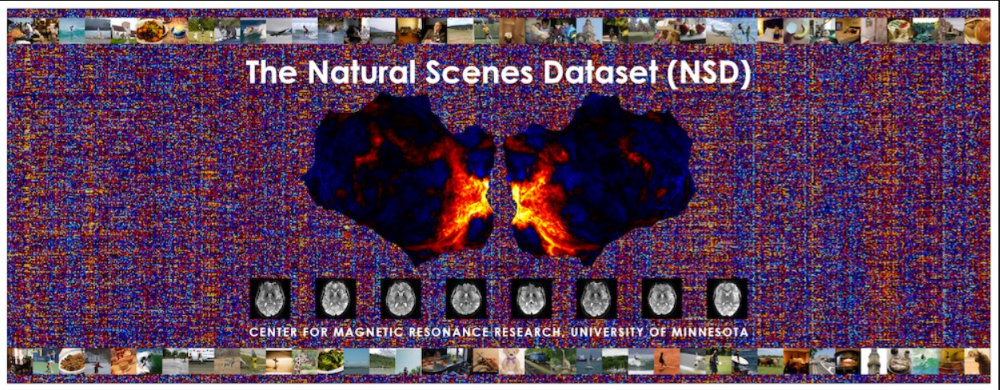

In [20]:
# @title Show image

display(IMG(filename="NSD.png"))

## Loading the images

First, let's load the 90 image files with the Pillow Image class.

In [21]:
# @title Load the images and get image size

image_paths = sorted(IMAGES_DIR.glob("*.png")) # Find all pngs file paths in the image directory
images = [Image.open(p).convert('RGB') for p in image_paths] # Load them as Image objects
np.array(images[0]).shape # Dimensions of the image array: width x height x channels (RGB)

(425, 425, 3)

Now, let's take a look at these images.
Notice that the first 45 images we selected have no faces, while the other 45 do have faces in them!
So, we should expect to see a 2x2 block pattern in the Fusiform Face Area (FFA) representational dissimilarity matrices (RDMs).

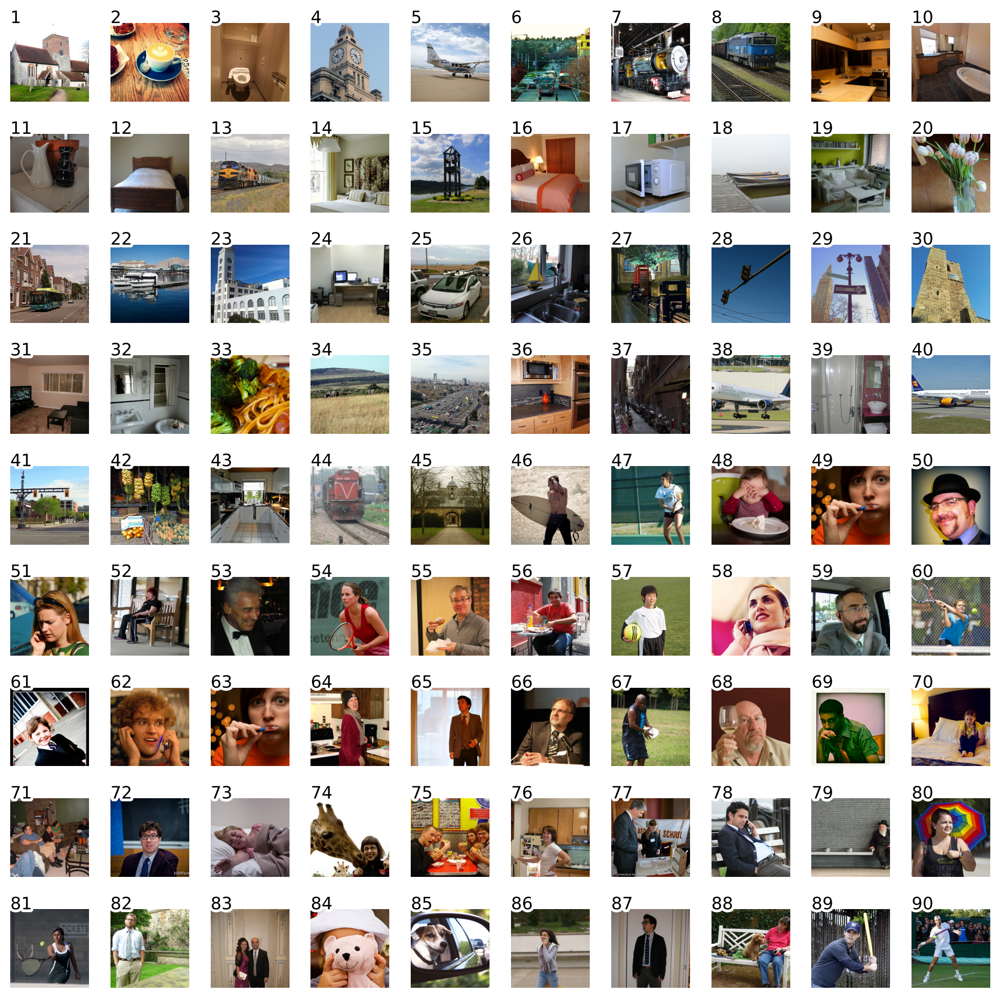

In [22]:
# @title Visualize images

with plt.xkcd():
    fig, ax = plt.subplots(9, 10, figsize=(10, 10))

    for i, img in enumerate(images):
        ax[i//10, i%10].imshow(img)
        ax[i//10, i%10].axis('off')
        ax[i//10, i%10].text(0, 0, str(i+1), color='black', fontsize=12)
    plt.show()

## Loading fMRI patterns from the Natural Scenes Dataset

Let's now load the fMRI patterns from NSD for these 90 images.
We have pre-extracted the patterns, so we just need to load Numpy arrays from the `.npy` files.

In [23]:
# @title Loading fMRI data
fmri_patterns = {}

for subject in SUBJECTS:
    fmri_patterns[subject] = {}

    for roi in ROIS:
        fmri_patterns[subject][roi] = {}

        full_data = np.load(FMRI_PATTERNS_DIR / f"subj{subject}_{roi}.npy")
        fmri_patterns[subject][roi] = full_data

# This is how we can index into subject 5 FFA patterns for all the images
fmri_patterns[5]["V1"].shape # Number of images x number of voxels

(90, 2950)

Let's now take a look at the pattern of responses for two non-face images and two face images.

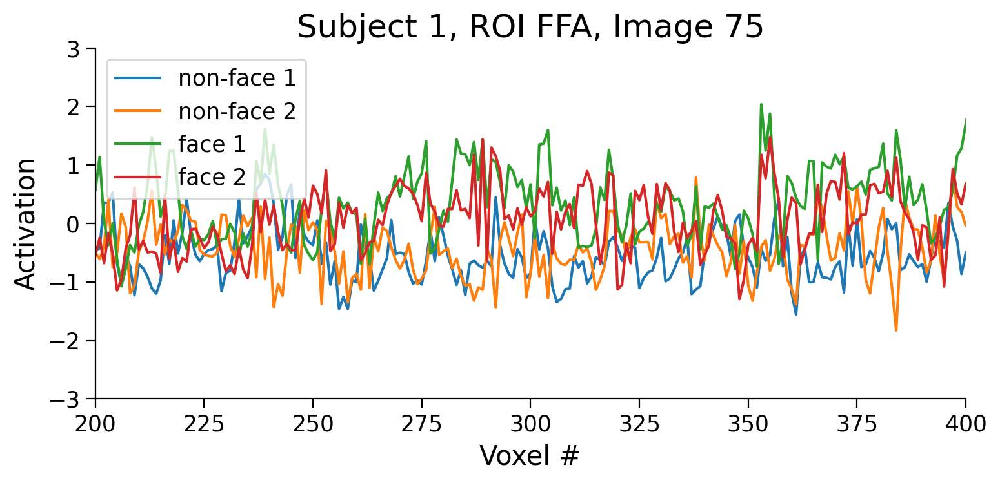

In [24]:
def plot_fmri_pattern(subject, roi, image_idx, ax):
    pattern = fmri_patterns[subject][roi][image_idx]
    ax.plot(pattern)
    ax.set_title(f"Subject {subject}, ROI {roi}, Image {image_idx}")
    ax.set_xlabel("Voxel #")
    ax.set_ylabel("Activation")
    ax.set_xlim([200, 400])
    ax.set_ylim([-3, 3])


plt.figure(figsize=(8, 4))
ax = plt.gca()
subject = 1
roi = "FFA"

# non-face images
plot_fmri_pattern(subject, roi, 1, ax)
plot_fmri_pattern(subject, roi, 3, ax)

# face images
plot_fmri_pattern(subject, roi, 57, ax)
plot_fmri_pattern(subject, roi, 75, ax)

plt.legend(['non-face 1', 'non-face 2', 'face 1', 'face 2'])
plt.show()

The activity is complex, but we clearly see several voxels (e.g., voxel 275) that have higher activation for faces than for non-faces. This is as expected for the face-selective FFA.

In [25]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_data_acquisition")

---
# Section 2: Get artificial neural network activations

Estimated timing to here from start of tutorial: 15 minutes


Now that we have fMRI patterns, we want to explain this data using computational models.

In this tutorial, we will take our models to be **layers of AlexNet**.

![](https://d2l.ai/_images/alexnet.svg)

*Comparing LeNet architecture to AlexNet. Image from [Dive Into Deep Learning book](https://d2l.ai/).*

We load a version of AlexNet that is already pre-trained on ImageNet. This step may take a minute; feel free to read ahead.

In [26]:
# @title Load AlexNet model pretrained on ImageNet
alexnet = torchvision.models.alexnet(weights="IMAGENET1K_V1")

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 134MB/s]


To pass images through the model, we need to _preprocess_ them to be in the same format as the images shown to the model during training.

For AlexNet, this includes resizing the images to 224x224 and normalizing their color channels to particular values. We also need to turn them into PyTorch tensors.

In [27]:
# @title Preprocess NSD images as input to AlexNet

# We need to use the exact same preprocessing as was used to train AlexNet
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224,224)), # Resize the images to 224x24 pixels
    torchvision.transforms.ToTensor(), # Convert the images to a PyTorch tensor
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # Normalize the image color channels
])

images_tensor = torch.stack([transform(img) for img in images])
print(images_tensor.shape) # (number of images, channels, height, width)

torch.Size([90, 3, 224, 224])


Let's inspect AlexNet architecture to select some of the layers as our models.

In [28]:
# @title Inspect architecture
print("Architecture of AlexNet:")
print(alexnet)

node_names = get_graph_node_names(alexnet) # this returns a tuple with layer names for the forward pass and the backward pass
print("\nGraph node names (layers) in the forward pass:")
print(node_names[0]) # forward pass layer names

Architecture of AlexNet:
AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_fe

We extract activations from different layers of AlexNet processing the same images that were presented to people during the NSD task.

In [29]:
# @title Make hooks in AlexNet to extract activations from different layers
return_nodes = {
    "features.2": "conv1",
    "features.5": "conv2",
    "features.7": "conv3",
    "features.9": "conv4",
    "features.12": "conv5",
    "classifier.1": "fc6",
    "classifier.4": "fc7",
    "classifier.6": "fc8"
}
feature_extractor = create_feature_extractor(alexnet, return_nodes=return_nodes)

In [30]:
# @title Extract activations from AlexNet
alexnet_activations = feature_extractor(images_tensor)

# Convert to numpy arrays
for layer, activations in alexnet_activations.items():

    act = activations.detach().numpy().reshape(len(images), -1)
    alexnet_activations[layer] = act  # Keep original data under 'all'

alexnet_activations['conv1'].shape # number of images x number of neurons in conv1 layer

(90, 46656)

In [31]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_ann_activations")

---
# Section 3: Create representational dissimilarity matrices (RDMs)

Estimated timing to here from start of tutorial: 20 minutes


Now that we have fMRI patterns and AlexNet activations, the first step in representation similarity analysis (RSA) is to compute the representational dissimilarity matrices (RDMs). RSA characterizes the representational geometry of the brain region of interest (ROI) by estimating the representational distance for each pair of experimental conditions (e.g., different images).

RDMs represent how dissimilar neural activity patterns or model activations are for each stimulus. In our case, these will be 90x90 image-by-image matrices representing how dissimilar fMRI patterns or AlexNet layer activations are for each image.

For instance, we expect that in FFA, there will be a large distance between the 45 face and 45 non-face images: we expect to see a 2x2 block pattern inside the RDM.

## Creating RSA toolbox datasets

First, let's wrap our neural and model data in `Dataset` objects to use the RSA toolbox.

In [32]:
# @title Create RSA datasets for each subject and ROI
fmri_datasets = {}

for subject in SUBJECTS:
    fmri_datasets[subject] = {}

    for roi in ROIS:
        fmri_datasets[subject][roi] = {}

        # for stimset in ['D1', 'D2', 'all']
        measurements = fmri_patterns[subject][roi]
        fmri_datasets[subject][roi] = rsa.data.Dataset(measurements=measurements,
                                                            descriptors = {'subject': subject, 'roi': roi},
                                                            obs_descriptors = {'image': np.arange(measurements.shape[0])},
                                                            ## this assumes that the patterns are all in the same order? - jasper
                                                            channel_descriptors = {'voxel': np.arange(measurements.shape[1])})

In [33]:
# @title Create RSA datasets for AlexNet activations
alexnet_datasets = {}

for layer, activations in alexnet_activations.items():
    alexnet_datasets[layer] = {}

    # For stimset in ['D1', 'D2', 'all', 'random']:
    measurements = activations
    alexnet_datasets[layer] = rsa.data.Dataset(measurements=measurements,
                                            descriptors={'layer': layer},
                                            obs_descriptors={'image': np.arange(measurements.shape[0])},
                                            channel_descriptors={'channel': np.arange(measurements.shape[1])})

## Computing the RDMs

Let's compute RDMs for fMRI patterns and AlexNet activations.

In [34]:
# @title Compute rdms for each subject and ROI
fmri_rdms = {}
fmri_rdms_list = []

for subject in SUBJECTS:
    fmri_rdms[subject] = {}

    for roi in ROIS:
        fmri_rdms[subject][roi] = {}

        # For stimset in ['D1', 'D2']:
        fmri_rdms[subject][roi] = rsa.rdm.calc_rdm(fmri_datasets[subject][roi])
        fmri_rdms_list.append(fmri_rdms[subject][roi])

## Coding Exercise 1: RDMs of AlexNet

Use the RSA toolbox to compute the RDMs for the layers of AlexNet. It should be done in the very same way as RDMs for fMRI patterns above.

In [36]:
#################################################
## TODO for students: fill in the missing variables ##
# Fill out function and remove
#raise NotImplementedError("Student exercise: fill in the missing variables")
#################################################

# Compute rdms for each layer of AlexNet
alexnet_rdms_dict = {}
for layer, dataset in alexnet_datasets.items():
    alexnet_rdms_dict[layer] = rsa.rdm.calc_rdm(dataset)

[*Click for solution*](https://github.com/neuromatch/NeuroAI_Course/tree/main/tutorials/W1D3_ComparingArtificialAndBiologicalNetworks/solutions/W1D3_Tutorial3_Solution_5ab03b03.py)



In [ ]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_rdms_of_alexnet")

## Visualizing human RDMs

Here we use methods on the `rsatoolbox` RDM object to select a subset of the RDMs.

In [37]:
fmri_rdms = rsa.rdm.concat(fmri_rdms_list)
ffa_rdms = fmri_rdms.subset('roi', 'FFA')
show_rdm_plotly(ffa_rdms, rdm_descriptor='subject')

As predicted above, we can see a 2x2 block-like pattern in the FFA fMRI pattern RDMs.

This is because we have 45 non-face images followed by 45 face images.

The lighter regions indicate larger representational distances.

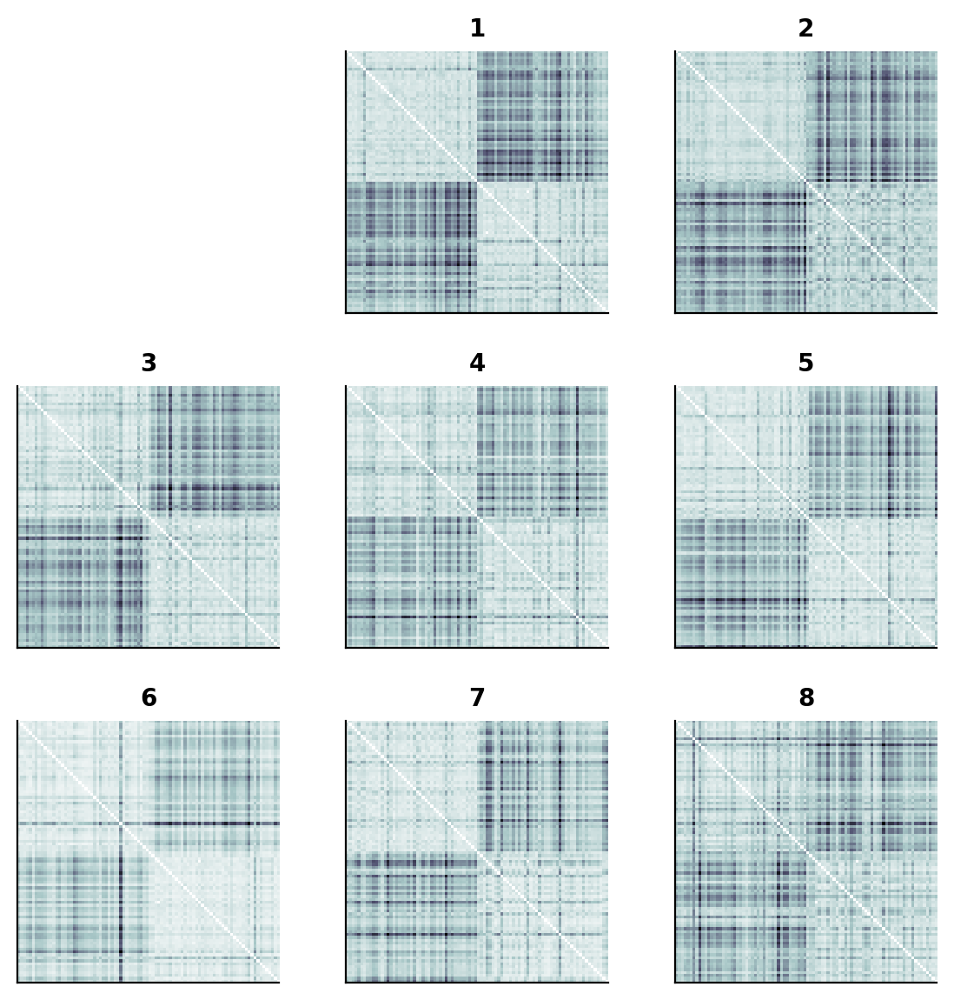

In [38]:
# the same RDMs, using a different visualization method
fmri_rdms = rsa.rdm.concat(fmri_rdms_list)
fig = rsa.vis.rdm_plot.show_rdm(ffa_rdms, rdm_descriptor='subject')[0]

## Coding Exercise 2: Human RDMs

Visualize the RDMs for the fMRI patterns from the V1 region.

In [39]:
fmri_rdms = rsa.rdm.concat(fmri_rdms_list)

In [40]:
#################################################
## TODO for students: fill in the missing variables ##
# Fill out function and remove
#raise NotImplementedError("Student exercise: fill in the missing variables")
#################################################
v1_rdms = fmri_rdms.subset('roi', 'V1')
show_rdm_plotly(v1_rdms, rdm_descriptor='subject')

[*Click for solution*](https://github.com/neuromatch/NeuroAI_Course/tree/main/tutorials/W1D3_ComparingArtificialAndBiologicalNetworks/solutions/W1D3_Tutorial3_Solution_147d3932.py)



In [ ]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_human_rdms")

## Visualizing AlexNet RDMs

Let's look at RDMs for different layers of AlexNet.

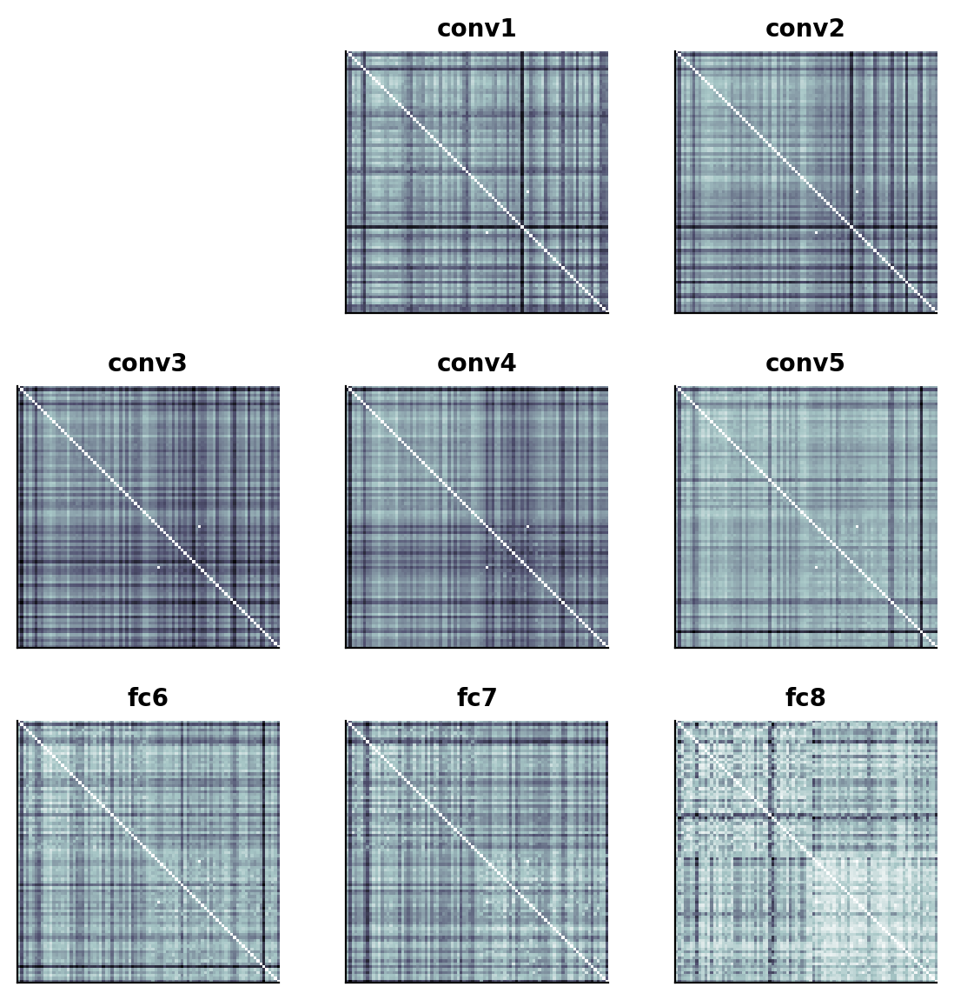

In [41]:
alexnet_rdms = rsa.rdm.concat(alexnet_rdms_dict.values())
fig = rsa.vis.rdm_plot.show_rdm(alexnet_rdms, rdm_descriptor='layer')[0]

Each RDM contains the dissimilarities for each pair of activation patterns extracted by the different layers.

We see a similar pattern emerge, clustering face and non-face images in fully connected `fc6`, `fc7`, and `fc8` layers.

AlexNet seems to represent faces differently than non-faces, at least to some extent.

In [42]:
# same RDMs, different visualization method
show_rdm_plotly(alexnet_rdms, rdm_descriptor='layer')

In [ ]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_create_rdms")

---
# Section 4: RSA. Model comparison and statistical inference

Estimated timing to here from start of tutorial: 35 minutes


In the second step of RSA, each model is evaluated by the accuracy of its prediction of the data RDM. To this end, we will use the RDMs we computed for each model representation.

Each model’s prediction of the data RDM is evaluated using an RDM comparator. In this case, we will use the correlation coefficient.

First, let's look at the performance of different Alexnet layers across all subjects.

In [43]:
# @title Get the Model objects to use the rsa toolbox for model comparisons
for layer, rdm in alexnet_rdms_dict.items():
    if layer == "conv1":
        models = [rsa.model.ModelFixed(rdm=rdm, name=layer)]
    else:
        models.append(rsa.model.ModelFixed(rdm=rdm, name=layer))

In [44]:
# @title Visualize AlexNet performance

roi = 'FFA'
human_rdms = fmri_rdms.subset('roi', roi)
models_to_compare = models

method = 'corr'
result =  rsa.inference.evaluate.eval_fixed(models_to_compare, human_rdms, method=method) # get the performance of the models compared to the fMRI data of the first 3 subjects for the FFA ROI

fig = plot_bars_and_scatter_with_table(result, models_to_compare, method, table = False)
fig.update_layout(title=dict(text = f"Performance of AlexNet layers on stimuli <br> in {roi} ROI for original set of subjects",
                              x=0.5, y=0.95,
                              font=dict(size=15)))
add_noise_ceiling_to_plot(fig, result.noise_ceiling)
fig.show()

In the plot, each data point represents the representational dissimilarity matrix (RDM) for an individual subject. The Y-axis indicates the correlation distance of the data RDMs to the RDM obtained from representations from each model layer. Each bar shows the mean correlation distance between data RDMs (across subjects) and one model layer. The observed variability reflects the extent to which our models (layers) accurately predict neural activity patterns across different individuals.

Our goal is to determine how these results might generalize to a new cohort of subjects and new sets of stimuli (assuming the new subjects and stimuli are sampled from the same respective populations). Since we cannot practically rerun the experiment countless times with fresh subjects and stimuli, we turn to computational simulations.

To achieve this, we will employ bootstrap resampling—a statistical technique that involves resampling our existing dataset with replacement to generate multiple simulated samples. This approach allows us to mimic the process of conducting the experiment anew with different subjects and/or different stimuli.

First, we'll focus on generalization to new subjects. By bootstrapping the subject dataset for each simulated sample, we can compute the predictive accuracy of our models on the subjects' RDMs. After running many simulations, we will accumulate a distribution of mean accuracy estimates that simulates the distribution of mean accuracies we might have obtained if we had actually repeated the experiment many times. This distribution will enable us to perform statistical inferences about our models’ generalizability to new subjects. Later, we will address the problem of generalizing to new stimuli as well.

Let's simulate a *new* sample of subjects by bootstrap resampling using the RSA toolbox.

In [48]:
boot_rdms, idx = rsa.inference.bootstrap_sample_rdm(human_rdms, rdm_descriptor='subject')

Now, we plot the RDMs of the bootstrapped sample.

Each RDM is a subject (note that some subjects might be repeated and some might be missing in the bootstrapped sample).

In [49]:
# @title Visualize RDMs
fig1 = show_rdm_plotly(fmri_rdms.subset('roi', 'FFA'), rdm_descriptor='subject')
fig1.update_layout(title=dict(text = f"Original sample of subjects",
                             x=0.5, y=0.95,
                             font=dict(size=20)))
fig2 = show_rdm_plotly(boot_rdms.subset('roi', 'FFA'), rdm_descriptor='subject')
fig2.update_layout(title=dict(text = f"Bootstrapped sample of subjects",
                             x=0.5, y=0.95,
                             font=dict(size=20)))
fig1.show()
fig2.show()

As before, each RDM contains the pairwise dissimilarities between activation patterns in the specified brain region (in this case, FFA) for each of the subjects.

The first row shows the RDMs for each of the original 8 subjects.
The second row shows 8 RDMs sampled from the set of 8 original RDMs with replacement. This is bootstrap resampling. It can be seen as a simulation of a "new" set of 8 subjects' RDMs. Notice that in this new set not all subjects are represented and some others might appear more than once.

The idea is to see how the results for the model evaluations would change had our data come from this simulated sample of subjects.

Let's see the model performance on different bootstrap resampled subject sets.

In [50]:
# @title Visualize model evaluations

boot_rdms, idx = rsa.inference.bootstrap_sample_rdm(human_rdms, rdm_descriptor='subject')
eval_result = rsa.inference.evaluate.eval_fixed(models_to_compare, boot_rdms, method=method)
fig = plot_bars_and_scatter_with_table(eval_result, models, method, color='blue', table = False)
fig.show()

If you run the cell above again, you will see the model performance for a new bootstrap sample of subjects.

### Discussion  

1. Explore the results for a few simulated new cohorts: run the cell above a few times and see how to points (individual RDMs) and bars (means) change.

**Hint**: For different simulated sets of subjects, the mean correlation of their RDMs to the RDMs given by each layer may look quite different. For example, if a given subject's RDM correlates very closely with layer `conv4`, and that subject is overrepresented in the bootstrap sample, the layer `conv4` might yield a higher accuracy compared to the other layers.

## Comparing representations statistically

How can we know if these differences in model performance are statistically significant?

That is what the third and final step of RSA does: we conduct inferential comparisons between models based on their accuracy in predicting the representational dissimilarity matrices (RDMs).

We leverage the variability in the performance estimates observed in the bootstrapped samples to conduct statistical tests. These tests are designed to determine whether the differences in RDM prediction accuracy between models are statistically significant.

In [51]:
plot_model_comparison_trans(result)

The Y-axis, again, shows RDM prediction accuracy, as measured by the correlation between the data RDMs and the model RDMs.
The error bars reflect the variability in this estimate across bootstrap samples over subjects). The gray bar indicates the noise ceiling, which is a measure of how well the best possible model (capturing the true data-generating process) could do, given the noise and intersubject variability in the data. The gray arrows indicate the models that don't perform significantly better than the noise-ceiling. The white dots at the bottom of the bars indicate the models whose correlation distance to the data RDMs is significantly better than zero.

#### Details of the figure above

Model comparisons are performed using a two-tailed t-test, FDR q < 0.01. Error bars indicate the standard error of the mean. One-sided comparisons of each model's performance against 0 and against the lower-bound estimate of the noise ceiling are Bonferroni-corrected for the number of models.

## Generalization to new images

We have applied a method that enables us to infer how well the models might perform when predicting neural activity patterns for a new cohort of subjects. However, this approach has not yet considered the variability that would arise when replicating the experiment with a new sample of stimuli.

To make statistical inferences expected to generalize to new stimuli, we will once again use a bootstrapping procedure, focusing this time on the stimuli rather than the subjects.

To do this, we will first maintain the original cohort of subjects and apply bootstrapping to resample the stimulus set. That is, for each subject, we will sample a new RDM based on the RDM from that subject's original activation patterns. The RDM will contain the pairwise dissimilarities between the response patterns to a set of stimuli sampled with replacement from the original set of stimuli.

In [52]:
# @title Get the RDMs for a bootstrap sample of the images
im_boot_rdms, pattern_idx = rsa.inference.bootstrap_sample_pattern(human_rdms, pattern_descriptor='index')


# plot RDMs
fig = show_rdm_plotly(im_boot_rdms.subset('roi', 'FFA'), rdm_descriptor='subject')
fig.show()

As before, rerunning the cell above will show you the RDMs for a new set of bootstrap-resampled stimuli each time.

Note that the block-like structure from before is generally preserved. This is because the stimuli are sorted so that the face stimuli are still adjacent to other face stimuli, and non-face stimuli are adjacent to other non-face stimuli. What changes are the specific stimuli used when computing the RDM. For each bootstrap resample, some stimuli might appear more than once, and some might be left out.

Let's see the inferential model comparisons based on 1000 bootstraps of the image set.

In [53]:
result = rsa.inference.eval_bootstrap_pattern(models, human_rdms, theta=None, method='corr', N=1000,
                           pattern_descriptor='index', rdm_descriptor='index',
                           boot_noise_ceil=True)

plot_model_comparison_trans(result)

100%|██████████| 1000/1000 [00:15<00:00, 63.02it/s]


The Y-axis shows RDM prediction accuracy, as measured by the correlation distance between the data RDMs and the model RDMs.
The error bars reflect the variability in this estimate across bootstrap samples (over stimuli). The gray bar indicates the noise ceiling, which is a measure of how well any model could do, given the noise in the data. The gray arrows indicate the models that don't perform significantly better than the noise-ceiling. The white dots at the bottom of the bars indicate the models whose correlation distance to the data RDMs is significantly better than zero.

#### Details of the figure above

Model comparisons: two-tailed t-test, FDR q < 0.01. Error bars indicate the standard error of the mean. One-sided comparisons of each model's performance against 0 and against the lower-bound estimate of the noise ceiling are Bonferroni-corrected for the number of models.

In [ ]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_model_comparison_statistical_inference")

---
# Section 5: Model Comparison Using Two-factor Bootstrap

Estimated timing to here from start of tutorial: 45 minutes


For generalization across both the subject and stimulus populations, we can use a two-factor bootstrap method. For an in-depth discussion of this technique, refer to [Schütt et al., 2023](https://elifesciences.org/articles/82566).

We can use the RSA toolbox to implement bootstrap resampling of subjects and stimuli simultaneously. It is important to note that a naive 2-factor bootstrap approach triple-counts the variance contributed by the measurement noise. For further understanding of this issue, see the explanation provided by Schütt et al. Fortunately, the RSA toolbox has an implementation that corrects this potential overestimation.

Let's evaluate the performance of the models with simultaneous bootstrap resampling of the subjects and stimuli.

In [54]:
eval_result = rsa.inference.eval_dual_bootstrap(models, fmri_rdms.subset('roi', 'FFA'), method='corr')
print(eval_result)

100%|██████████| 1000/1000 [00:47<00:00, 21.06it/s]

Results for running dual_bootstrap evaluation for corr on 8 models:

Model |   Eval ± SEM   | p (against 0) | p (against NC) |
---------------------------------------------------------
conv1 |  0.036 ± 0.042 |        0.208  |       < 0.001  |
conv2 |  0.092 ± 0.048 |        0.048  |       < 0.001  |
conv3 |  0.089 ± 0.046 |        0.047  |       < 0.001  |
conv4 |  0.127 ± 0.052 |        0.022  |       < 0.001  |
conv5 |  0.106 ± 0.058 |        0.054  |       < 0.001  |
fc6   |  0.099 ± 0.045 |        0.033  |       < 0.001  |
fc7   |  0.079 ± 0.038 |        0.037  |       < 0.001  |
fc8   |  0.157 ± 0.049 |        0.007  |       < 0.001  |

p-values are based on uncorrected t-tests


In [55]:
plot_model_comparison_trans(eval_result)

In the plot above, the statistical comparison results take into account the variability in the data that comes from considering different sets of subjects and sets of stimuli.

In [ ]:
# @title Submit your feedback
content_review(f"{feedback_prefix}_model_comparison_two_factor_bootstrap")

---
# Summary

*Estimated timing of tutorial: 50 minutes*

In this tutorial, we:

1. Reviewed the principles of RSA in the context of machine learning and computational neuroscience and applied it to the problem of comparing representations between fMRI patterns and neural network models for a vision task.

2. Explored the structure of AlexNet and extracted activations from the different layers of this neural network to a set of visual stimuli.

3. Evaluated how well the different layers of AlexNet could explain neural responses from humans to the same stimuli, by comparing the representations extracted from these layers (which we treated as different models) to the activity patterns derived from fMRI data.

4. Used frequentist statistical inference to compare the performance of the different model representations (i.e. layers).

5. Addressed two sources of model-performance estimation error that statistical inference must account for in addition to the error due to measurement noise: stimulus sampling and subject sampling, using the 2-factor bootstrap method.

# The Big Picture

Generalization can arise across multiple dimensions, whether that be generalization of an experiment to a new set of subjects or whether a new set of stimuli generalize to the same subjects. More likely, we would want to know how much an experiment would generalize to novel subjects across novel stimuli. We can test these ideas statistically by using the bootstrap method in statistics. This notebook highlights some issues with naive approaches to statistics when assessing generalization in this way. We explored the 2-factor bootstrap method and used a toolbox that explicitly takes care of the calculation so that we don't overestimate the variance involved. It's important to be aware of factors of generalization and how multiple overlapping factors might interact.